# 06 — Análise visual de erros da CNN 2D

Este notebook apresenta a análise visual dos erros e acertos do baseline CNN 2D no conjunto de teste.

Ele não treina modelo e não recalcula predições.  
Ele apenas lê as saídas já geradas pelo script:

    python scripts/run_error_analysis.py

## Entradas

- reports/tables/error_analysis_group_cases.csv
- reports/tables/error_analysis_slice_cases.csv
- reports/figures/error_analysis/*.png

## Objetivo

Organizar visualmente os casos selecionados de:

- falsos negativos;
- falsos positivos;
- verdadeiros negativos;
- verdadeiros positivos.

Esta etapa prepara a leitura dos resultados antes do Grad-CAM.


## 1. Por que este notebook é o 06?

A numeração segue a sequência metodológica do projeto:

1. Dataset e splits;
2. Auditoria de qualidade das imagens;
3. EDA visual e técnica;
4. Baseline estatístico;
5. Baseline CNN 2D;
6. Análise visual de erros;
7. Grad-CAM.

Até agora, só o notebook da etapa 05 foi criado.  
As etapas 01 a 04 existem em scripts e documentação, mas ainda não foram transformadas em notebooks.

Por isso este notebook é o 06: ele continua a trilha metodológica, mesmo que os notebooks 01 a 04 ainda sejam criados depois.


In [1]:
from pathlib import Path

import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import Image, display


def find_project_root(start: Path) -> Path:
    """Encontra a raiz do projeto a partir do diretório atual do notebook."""
    start = start.resolve()

    candidates = [start] + list(start.parents)

    for candidate in candidates:
        has_reports = (candidate / "reports").exists()
        has_data = (candidate / "data").exists()
        has_src = (candidate / "src").exists()

        if has_reports and has_data and has_src:
            return candidate

    raise FileNotFoundError(
        "Não foi possível encontrar a raiz do projeto. "
        "Execute o notebook dentro do repositório mestrado_ml_visao_computacional."
    )


PROJECT_ROOT = find_project_root(Path.cwd())

GROUP_CASES_PATH = PROJECT_ROOT / "reports" / "tables" / "error_analysis_group_cases.csv"
SLICE_CASES_PATH = PROJECT_ROOT / "reports" / "tables" / "error_analysis_slice_cases.csv"
FIGURES_DIR = PROJECT_ROOT / "reports" / "figures" / "error_analysis"

print("Diretório atual do notebook:")
print(Path.cwd())

print("\nRaiz do projeto detectada:")
print(PROJECT_ROOT)

print("\nArquivos de entrada:")
print("group_cases:", GROUP_CASES_PATH)
print("slice_cases:", SLICE_CASES_PATH)
print("figures_dir:", FIGURES_DIR)

print("\nValidação de existência:")
print("group_cases existe:", GROUP_CASES_PATH.exists())
print("slice_cases existe:", SLICE_CASES_PATH.exists())
print("figures_dir existe:", FIGURES_DIR.exists())

missing = [
    path for path in [GROUP_CASES_PATH, SLICE_CASES_PATH, FIGURES_DIR]
    if not path.exists()
]

if missing:
    raise FileNotFoundError(
        "Entradas não encontradas:\n" + "\n".join(str(path) for path in missing)
    )


Diretório atual do notebook:
C:\GitHub\mestrado_ml_visao_computacional\notebooks

Raiz do projeto detectada:
C:\GitHub\mestrado_ml_visao_computacional

Arquivos de entrada:
group_cases: C:\GitHub\mestrado_ml_visao_computacional\reports\tables\error_analysis_group_cases.csv
slice_cases: C:\GitHub\mestrado_ml_visao_computacional\reports\tables\error_analysis_slice_cases.csv
figures_dir: C:\GitHub\mestrado_ml_visao_computacional\reports\figures\error_analysis

Validação de existência:
group_cases existe: True
slice_cases existe: True
figures_dir existe: True


## 2. Carregar tabelas da análise de erros

A tabela `error_analysis_group_cases.csv` contém os grupos selecionados para inspeção.

A tabela `error_analysis_slice_cases.csv` contém os slices representativos dentro desses grupos.


In [2]:
group_cases = pd.read_csv(GROUP_CASES_PATH)
slice_cases = pd.read_csv(SLICE_CASES_PATH)

print("Dimensão group_cases:", group_cases.shape)
print("Dimensão slice_cases:", slice_cases.shape)

group_cases


Dimensão group_cases: (11, 10)
Dimensão slice_cases: (66, 15)


,outcome,split,inferred_group_id,label,label_name,pred_label,pred_label_name,prob_positive,prob_positive_std,n_slices
0,FN,test,207-img-00043,1,Hepatic_Steatosis,0,Healthy,0.116396,0.060341,12
1,FN,test,231-img-00019,1,Hepatic_Steatosis,0,Healthy,0.177643,0.075625,12
2,FN,test,72-img-00032,1,Hepatic_Steatosis,0,Healthy,0.304864,0.078663,16
3,FP,test,114-img-00064,0,Healthy,1,Hepatic_Steatosis,0.805880,0.030862,24
4,FP,test,96-img-00049,0,Healthy,1,Hepatic_Steatosis,0.606519,0.096529,18
5,TN,test,106-img-00060,0,Healthy,0,Healthy,0.059209,0.019379,21
6,TN,test,149-img-00097,0,Healthy,0,Healthy,0.055023,0.015284,24
7,TN,test,82-img-00039,0,Healthy,0,Healthy,0.060209,0.013192,21
8,TP,test,190-img-00028,1,Hepatic_Steatosis,1,Hepatic_Steatosis,0.995595,0.001632,12
9,TP,test,194-img-00032,1,Hepatic_Steatosis,1,Hepatic_Steatosis,0.994740,0.002665,12


## 3. Distribuição dos grupos selecionados

Os grupos são classificados em:

- FN: falso negativo;
- FP: falso positivo;
- TN: verdadeiro negativo;
- TP: verdadeiro positivo.


In [3]:
outcome_counts = group_cases["outcome"].value_counts().sort_index()
outcome_counts


outcome
FN    3
FP    2
TN    3
TP    3
Name: count, dtype: int64

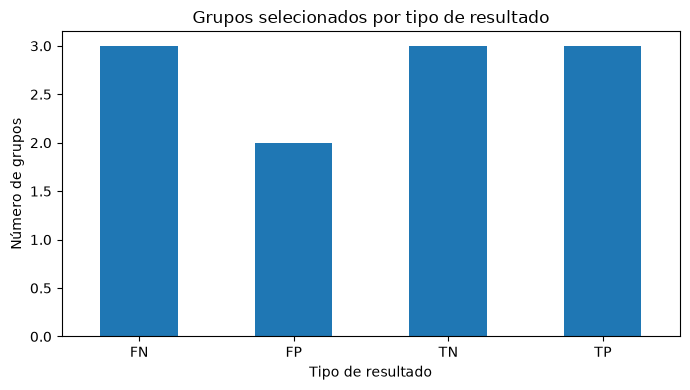

In [4]:
ax = outcome_counts.plot(kind="bar", figsize=(7, 4))

ax.set_title("Grupos selecionados por tipo de resultado")
ax.set_xlabel("Tipo de resultado")
ax.set_ylabel("Número de grupos")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()


## 4. Grupos selecionados para inspeção

A probabilidade positiva representa a probabilidade média do grupo para a classe `Hepatic_Steatosis`.

Valores próximos de 1 indicam maior confiança na classe positiva.  
Valores próximos de 0 indicam maior confiança na classe `Healthy`.


In [5]:
cols = [
    "outcome",
    "inferred_group_id",
    "label_name",
    "pred_label_name",
    "prob_positive",
    "prob_positive_std",
    "n_slices",
]

group_cases[cols].sort_values(["outcome", "prob_positive"])


,outcome,inferred_group_id,label_name,pred_label_name,prob_positive,prob_positive_std,n_slices
0,FN,207-img-00043,Hepatic_Steatosis,Healthy,0.116396,0.060341,12
1,FN,231-img-00019,Hepatic_Steatosis,Healthy,0.177643,0.075625,12
2,FN,72-img-00032,Hepatic_Steatosis,Healthy,0.304864,0.078663,16
4,FP,96-img-00049,Healthy,Hepatic_Steatosis,0.606519,0.096529,18
3,FP,114-img-00064,Healthy,Hepatic_Steatosis,0.805880,0.030862,24
6,TN,149-img-00097,Healthy,Healthy,0.055023,0.015284,24
5,TN,106-img-00060,Healthy,Healthy,0.059209,0.019379,21
7,TN,82-img-00039,Healthy,Healthy,0.060209,0.013192,21
10,TP,98-img-00052,Hepatic_Steatosis,Hepatic_Steatosis,0.994547,0.000722,12
9,TP,194-img-00032,Hepatic_Steatosis,Hepatic_Steatosis,0.994740,0.002665,12


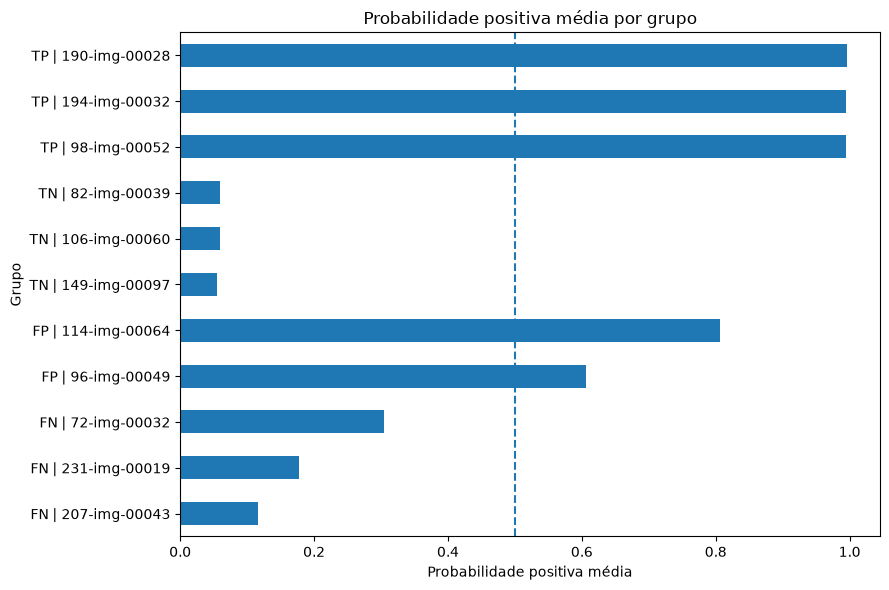

In [6]:
plot_df = group_cases.sort_values(["outcome", "prob_positive"]).copy()
plot_df["case"] = plot_df["outcome"] + " | " + plot_df["inferred_group_id"]

ax = plot_df.plot(
    kind="barh",
    x="case",
    y="prob_positive",
    figsize=(9, 6),
    legend=False,
)

ax.axvline(0.5, linestyle="--")
ax.set_title("Probabilidade positiva média por grupo")
ax.set_xlabel("Probabilidade positiva média")
ax.set_ylabel("Grupo")
plt.tight_layout()
plt.show()


## 5. Slices representativos

Para cada grupo selecionado, o script escolheu slices distribuídos pela ordenação de probabilidade positiva.

Isso evita olhar apenas para o slice mais extremo e permite observar variação interna dentro do mesmo grupo.


In [7]:
slice_cols = [
    "group_outcome",
    "inferred_group_id",
    "class_name",
    "filename",
    "slice_id",
    "label_name",
    "pred_label_name",
    "prob_positive",
    "group_prob_positive",
]

slice_cases[slice_cols].head(30)


,group_outcome,inferred_group_id,class_name,filename,slice_id,label_name,pred_label_name,prob_positive,group_prob_positive
0,FN,207-img-00043,Hepatic_Steatosis,207-img-00043-00247.jpg,247,Hepatic_Steatosis,Healthy,0.062009,0.116396
1,FN,207-img-00043,Hepatic_Steatosis,207-img-00043-00246.jpg,246,Hepatic_Steatosis,Healthy,0.074334,0.116396
2,FN,207-img-00043,Hepatic_Steatosis,207-img-00043-00245.jpg,245,Hepatic_Steatosis,Healthy,0.086126,0.116396
3,FN,207-img-00043,Hepatic_Steatosis,207-img-00043-00249.jpg,249,Hepatic_Steatosis,Healthy,0.100682,0.116396
4,FN,207-img-00043,Hepatic_Steatosis,207-img-00043-00250.jpg,250,Hepatic_Steatosis,Healthy,0.171641,0.116396
5,FN,207-img-00043,Hepatic_Steatosis,207-img-00043-00252.jpg,252,Hepatic_Steatosis,Healthy,0.250932,0.116396
6,FN,231-img-00019,Hepatic_Steatosis,231-img-00019-00252.jpg,252,Hepatic_Steatosis,Healthy,0.083668,0.177643
7,FN,231-img-00019,Hepatic_Steatosis,231-img-00019-00250.jpg,250,Hepatic_Steatosis,Healthy,0.094923,0.177643
8,FN,231-img-00019,Hepatic_Steatosis,231-img-00019-00248.jpg,248,Hepatic_Steatosis,Healthy,0.140585,0.177643
9,FN,231-img-00019,Hepatic_Steatosis,231-img-00019-00245.jpg,245,Hepatic_Steatosis,Healthy,0.208955,0.177643


## 6. Figuras disponíveis

Cada figura mostra um painel com slices representativos do mesmo `inferred_group_id`.

As figuras foram geradas em:

    reports/figures/error_analysis/


In [8]:
figure_paths = sorted(FIGURES_DIR.glob("*.png"))

print("Total de figuras encontradas:", len(figure_paths))

for path in figure_paths:
    print(path.name)


Total de figuras encontradas: 11
FN_207-img-00043.png
FN_231-img-00019.png
FN_72-img-00032.png
FP_114-img-00064.png
FP_96-img-00049.png
TN_106-img-00060.png
TN_149-img-00097.png
TN_82-img-00039.png
TP_190-img-00028.png
TP_194-img-00032.png
TP_98-img-00052.png


## 7. Falsos negativos

Casos reais de `Hepatic_Steatosis` classificados como `Healthy`.

Esses casos são importantes porque mostram onde o modelo deixou de identificar a classe positiva.


FN_207-img-00043.png


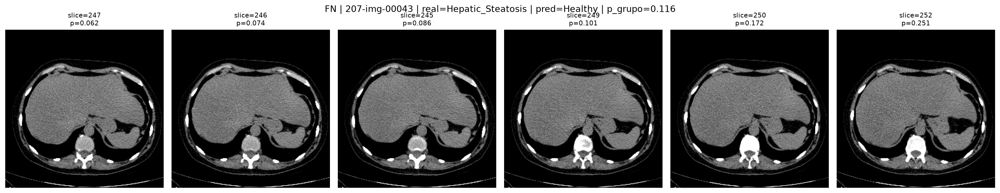

FN_231-img-00019.png


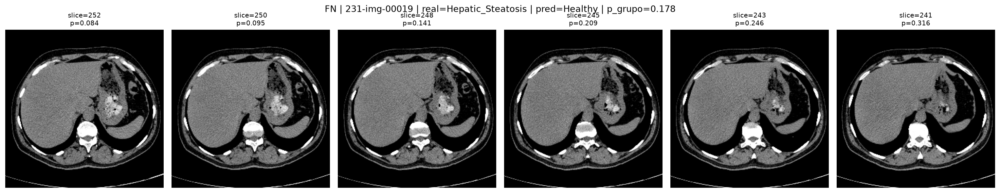

FN_72-img-00032.png


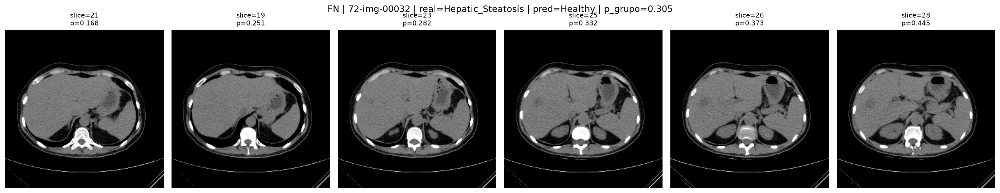

In [9]:
for path in sorted(FIGURES_DIR.glob("FN_*.png")):
    print(path.name)
    display(Image(filename=str(path)))


## 8. Falsos positivos

Casos reais de `Healthy` classificados como `Hepatic_Steatosis`.

Esses casos ajudam a investigar se o modelo pode estar confundindo textura, contraste, bordas, ruído ou artefatos JPEG com sinal de esteatose.


FP_114-img-00064.png


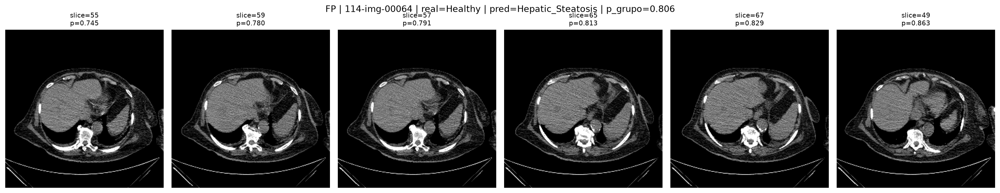

FP_96-img-00049.png


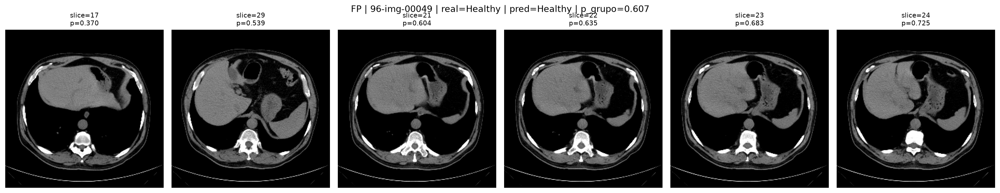

In [10]:
for path in sorted(FIGURES_DIR.glob("FP_*.png")):
    print(path.name)
    display(Image(filename=str(path)))


## 9. Verdadeiros negativos

Casos reais de `Healthy` classificados corretamente como `Healthy`.

Eles servem como referência visual de baixa probabilidade positiva.


TN_106-img-00060.png


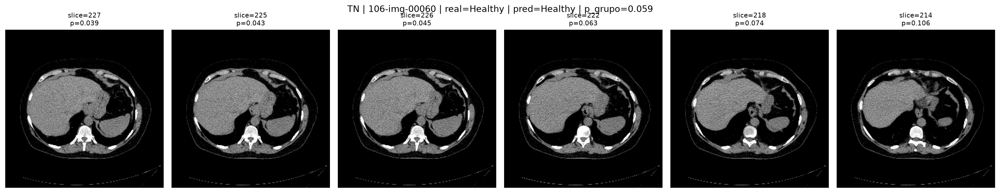

TN_149-img-00097.png


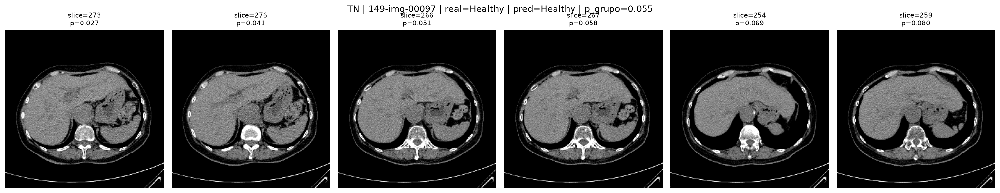

TN_82-img-00039.png


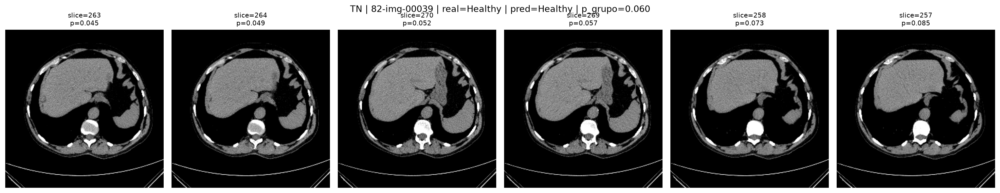

In [11]:
for path in sorted(FIGURES_DIR.glob("TN_*.png")):
    print(path.name)
    display(Image(filename=str(path)))


## 10. Verdadeiros positivos

Casos reais de `Hepatic_Steatosis` classificados corretamente como `Hepatic_Steatosis`.

Eles servem como referência visual de alta probabilidade positiva.


TP_190-img-00028.png


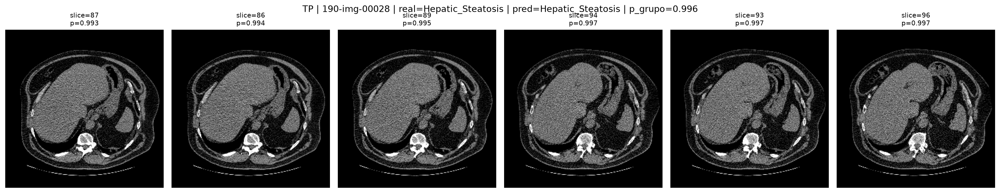

TP_194-img-00032.png


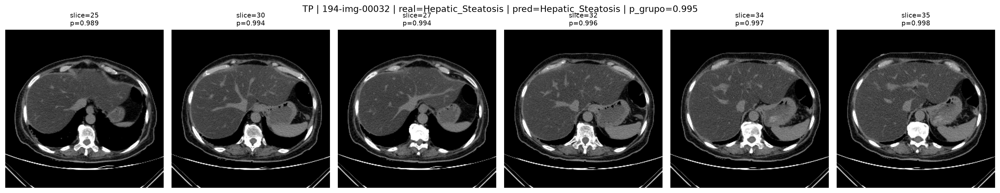

TP_98-img-00052.png


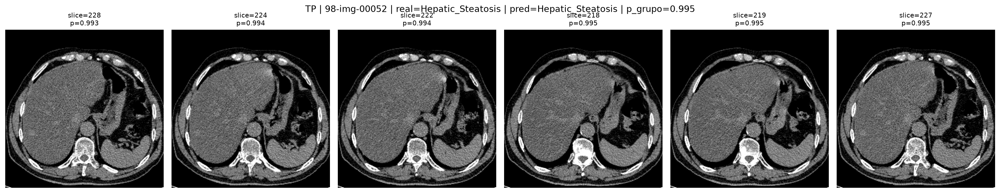

In [12]:
for path in sorted(FIGURES_DIR.glob("TP_*.png")):
    print(path.name)
    display(Image(filename=str(path)))


## 11. Leitura crítica

Esta análise é qualitativa e exploratória.

Ela não valida clinicamente o modelo, porque:

- as imagens são JPEG;
- não há DICOM;
- não há HU confiável;
- não há metadados clínicos;
- não há informação de scanner, protocolo ou fase;
- não há segmentação hepática;
- `inferred_group_id` é um agrupamento técnico, não uma identificação clínica validada.

A utilidade desta etapa é preparar a interpretação visual para o Grad-CAM.

## Próxima etapa

Aplicar Grad-CAM nos slices selecionados para investigar onde a CNN concentra evidência visual para suas decisões.
